Model
- NAFNet

Architecture
-    enc_blks = [1, 1, 1, 1]
-    middle_blk_num = 1 x2
-    dec_blks = [1, 1, 1, 1]

CONFIG
- Learning rate = 1e-3
- Batch size    = 8

Augmentation
- Horizontal Flip
- Vertical Flip

Performance
- Epoch : 60
- Loss : 55.74131965637207
- PSNR : 44.25868034362793
- SSIM : 0.9867691099643707

In [ ]:
!pip install gdown

In [2]:
pip install torch-summary

Note: you may need to restart the kernel to use updated packages.


In [3]:
import gdown
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
!pip install ptflops
from ptflops import get_model_complexity_info
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
!pip install torchmetrics
# import torch_xla.core.xla_model as xm
# import torch_xla.distributed.parallel_loader as pl
# import torch_xla.distributed.xla_multiprocessing as xmp

In [4]:
torch.manual_seed(42)
np.random.seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
gdown.download_folder(id='1hlMr2ruSB3sO_5hFJvqOJUdm4yIpu3mN', output='/content/')

Retrieving folder contents


Processing file 1jg8Dv4zCB_s2ZpIqsYrluM0cTSUNBTHv gt_images_128.npy
Processing file 1sM1f0TDuDrNmluncRhnMXn99n68dK7vb gt_images_256.npy
Processing file 1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU gt_images.npy
Processing file 1OuSWA9aryPFNfeOndSHrUy1mQ2ddiV-R noisy_images_128.npy
Processing file 1LUHfeNh9iGFwSr-90fIxhEsx6uAxamRc noisy_images_256.npy
Processing file 1fsK8dwIh33N58wrwNe-Kf0ZT2e1znl6Q noisy_images.npy


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1jg8Dv4zCB_s2ZpIqsYrluM0cTSUNBTHv
To: /content/SIDD/gt_images_128.npy
100%|██████████| 62.9M/62.9M [00:04<00:00, 13.4MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1sM1f0TDuDrNmluncRhnMXn99n68dK7vb
From (redirected): https://drive.google.com/uc?id=1sM1f0TDuDrNmluncRhnMXn99n68dK7vb&confirm=t&uuid=5827623f-2d1e-4549-a45a-ea7a40aa6084
To: /content/SIDD/gt_images_256.npy
100%|██████████| 126M/126M [00:03<00:00, 34.4MB/s] 
Downloading...
From (original): https://drive.google.com/uc?id=1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU
From (redirected): https://drive.google.com/uc?id=1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU&confirm=t&uuid=f2cbb035-ded4-4fce-930d-ca2f17da3e09
To: /content/SIDD/gt_images.npy
100%|██████████| 252M/252M [00:09<00:00, 27.5MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1OuSWA9aryPFNfeOndSHrUy1mQ2ddi

['/content/SIDD/gt_images_128.npy',
 '/content/SIDD/gt_images_256.npy',
 '/content/SIDD/gt_images.npy',
 '/content/SIDD/noisy_images_128.npy',
 '/content/SIDD/noisy_images_256.npy',
 '/content/SIDD/noisy_images.npy']

In [6]:
# gdown.download_folder(id='1lWazkj3fm8eBN77qJ302-jsmxNmaXA_v', output='/content/')

In [7]:
noisy_images = np.load('/content/SIDD/noisy_images_256.npy')
gt_images = np.load('/content/SIDD/gt_images_256.npy')

In [8]:
# noisy_images = np.load('/content/cbsd/noise_25.npy')
# gt_images = np.load('/content/cbsd/gt_images.npy')

In [9]:
gt_images.shape

(160, 3, 256, 256)

In [10]:
noisy_images.shape

(160, 3, 256, 256)

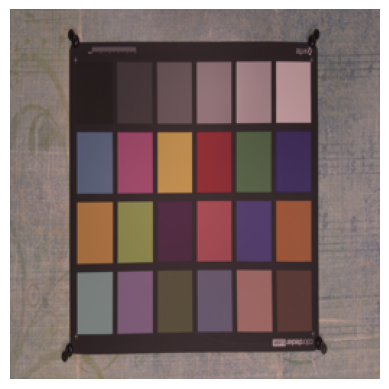

In [11]:
image = gt_images[1]
img = image.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
plt.imshow(img)
plt.axis('off')
plt.show()

In [12]:
indices = np.arange(len(noisy_images))
np.random.shuffle(indices)

# Use the same shuffled indices for shuffling both arrays
noisy_images = noisy_images[indices]
gt_images = gt_images[indices]

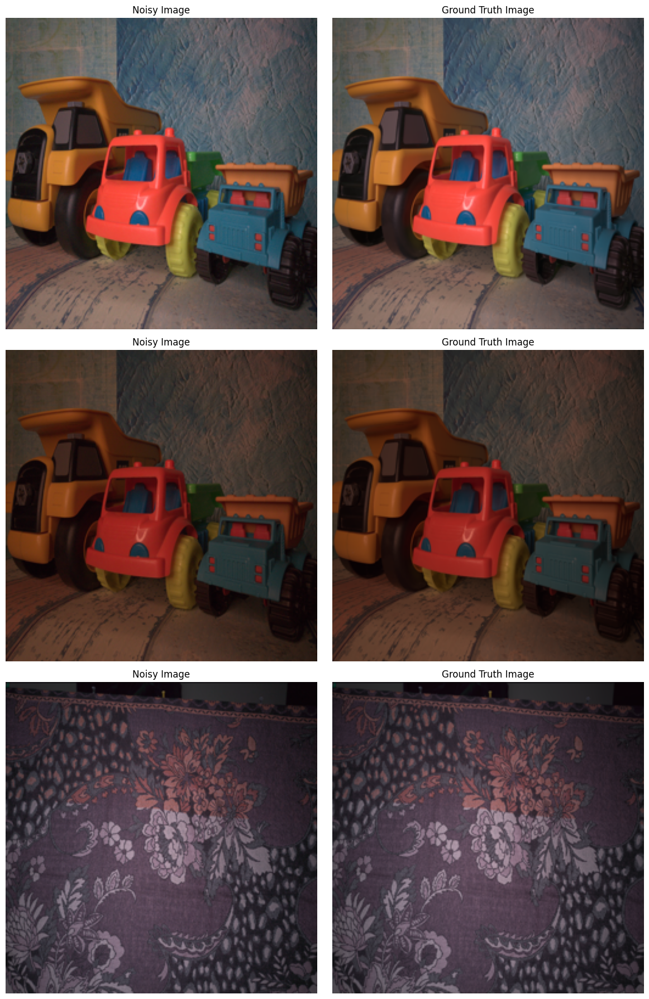

In [13]:
num_images_to_display = 3

plt.figure(figsize=(12, 6*num_images_to_display))

# Permute axis for each image pair before displaying
for i in range(num_images_to_display):
    # Permute axis for noisy image
    noisy_image_permuted = np.transpose(noisy_images[i], (1, 2, 0))
    
    # Permute axis for ground truth image
    gt_image_permuted = np.transpose(gt_images[i], (1, 2, 0))
    
    # Plot noisy image
    plt.subplot(num_images_to_display, 2, i*2 + 1)
    plt.imshow(noisy_image_permuted)
    plt.title("Noisy Image")
    plt.axis('off')
    
    # Plot ground truth image
    plt.subplot(num_images_to_display, 2, i*2 + 2)
    plt.imshow(gt_image_permuted)
    plt.title("Ground Truth Image")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [14]:
np.max(noisy_images)

1.0

In [15]:
length = len(noisy_images)
train = int(length * 0.8)
val = int(length * 0.9)
print(length, train, val)

160 128 144


In [16]:
# ------------------------------------------------------------------------
# Copyright (c) 2022 megvii-model. All Rights Reserved.
# ------------------------------------------------------------------------

'''
Simple Baselines for Image Restoration

@article{chen2022simple,
  title={Simple Baselines for Image Restoration},
  author={Chen, Liangyu and Chu, Xiaojie and Zhang, Xiangyu and Sun, Jian},
  journal={arXiv preprint arXiv:2204.04676},
  year={2022}
}
'''

'\nSimple Baselines for Image Restoration\n\n@article{chen2022simple,\n  title={Simple Baselines for Image Restoration},\n  author={Chen, Liangyu and Chu, Xiaojie and Zhang, Xiangyu and Sun, Jian},\n  journal={arXiv preprint arXiv:2204.04676},\n  year={2022}\n}\n'

In [17]:
class LayerNormFunction(torch.autograd.Function):

    @staticmethod
    def forward(ctx, x, weight, bias, eps):
        ctx.eps = eps
        N, C, H, W = x.size()
        mu = x.mean(1, keepdim=True)
        var = (x - mu).pow(2).mean(1, keepdim=True)
        y = (x - mu) / (var + eps).sqrt()
        ctx.save_for_backward(y, var, weight)
        y = weight.view(1, C, 1, 1) * y + bias.view(1, C, 1, 1)
        return y

    @staticmethod
    def backward(ctx, grad_output):
        eps = ctx.eps

        N, C, H, W = grad_output.size()
        y, var, weight = ctx.saved_variables
        g = grad_output * weight.view(1, C, 1, 1)
        mean_g = g.mean(dim=1, keepdim=True)

        mean_gy = (g * y).mean(dim=1, keepdim=True)
        gx = 1. / torch.sqrt(var + eps) * (g - y * mean_gy - mean_g)
        return gx, (grad_output * y).sum(dim=3).sum(dim=2).sum(dim=0), grad_output.sum(dim=3).sum(dim=2).sum(
            dim=0), None

class LayerNorm2d(nn.Module):

    def __init__(self, channels, eps=1e-6):
        super(LayerNorm2d, self).__init__()
        self.register_parameter('weight', nn.Parameter(torch.ones(channels)))
        self.register_parameter('bias', nn.Parameter(torch.zeros(channels)))
        self.eps = eps

    def forward(self, x):
        return LayerNormFunction.apply(x, self.weight, self.bias, self.eps)


def replace_layers(model, base_size, train_size, fast_imp, **kwargs):
    for n, m in model.named_children():
        if len(list(m.children())) > 0:
            ## compound module, go inside it
            replace_layers(m, base_size, train_size, fast_imp, **kwargs)

        if isinstance(m, nn.AdaptiveAvgPool2d):
            pool = AvgPool2d(base_size=base_size, fast_imp=fast_imp, train_size=train_size)
            assert m.output_size == 1
            setattr(model, n, pool)


'''
ref.
@article{chu2021tlsc,
  title={Revisiting Global Statistics Aggregation for Improving Image Restoration},
  author={Chu, Xiaojie and Chen, Liangyu and and Chen, Chengpeng and Lu, Xin},
  journal={arXiv preprint arXiv:2112.04491},
  year={2021}
}
'''
class Local_Base():
    def convert(self, *args, train_size, **kwargs):
        replace_layers(self, *args, train_size=train_size, **kwargs)
        imgs = torch.rand(train_size)
        with torch.no_grad():
            self.forward(imgs)

class SimpleGate(nn.Module):
    def forward(self, x):
        x1, x2 = x.chunk(2, dim=1)
        return x1 * x2

class NAFBlock(nn.Module):
    def __init__(self, c, DW_Expand=2, FFN_Expand=2, drop_out_rate=0.):
        super().__init__()
        dw_channel = c * DW_Expand
        self.conv1 = nn.Conv2d(in_channels=c, out_channels=dw_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv2 = nn.Conv2d(in_channels=dw_channel, out_channels=dw_channel, kernel_size=3, padding=1, stride=1, groups=dw_channel,
                               bias=True)
        self.conv3 = nn.Conv2d(in_channels=dw_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        # Simplified Channel Attention
        self.sca = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels=dw_channel // 2, out_channels=dw_channel // 2, kernel_size=1, padding=0, stride=1,
                      groups=1, bias=True),
        )

        # SimpleGate
        self.sg = SimpleGate()

        ffn_channel = FFN_Expand * c
        self.conv4 = nn.Conv2d(in_channels=c, out_channels=ffn_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv5 = nn.Conv2d(in_channels=ffn_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        self.norm1 = LayerNorm2d(c)
        self.norm2 = LayerNorm2d(c)

        self.dropout1 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        self.dropout2 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()

        self.beta = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
        self.gamma = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)

    def forward(self, inp):
        x = inp

        x = self.norm1(x)

        x = self.conv1(x)
        x = self.conv2(x)
        x = self.sg(x)
        x = x * self.sca(x)
        x = self.conv3(x)

        x = self.dropout1(x)

        y = inp + x * self.beta

        x = self.conv4(self.norm2(y))
        x = self.sg(x)
        x = self.conv5(x)

        x = self.dropout2(x)

        return y + x * self.gamma

class HalfUNet(nn.Module):
    def __init__(self, input_channels=3):
        super(HalfUNet, self).__init__()
        self.initial = nn.Conv2d(3, 64, 1, 1)
        self.conv1 = nn.Sequential(
            NAFBlock(64)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Sequential(
            NAFBlock(64)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Sequential(
            NAFBlock(64)
        )

        self.conv_up3 = nn.Conv2d(64, 64 * 16, 1, bias=False)
        self.up3 = nn.PixelShuffle(4)
        self.conv_up2 = nn.Conv2d(64, 64 * 4, 1, bias=False)
        self.up2 = nn.PixelShuffle(2)
        self.final_conv = nn.Conv2d(64, 3, kernel_size=1)
        # If you want to perform multi-class segmentation, change the output channels to the desired number

    def forward(self, x):
        x = self.initial(x)
        x1 = self.conv1(x)
        pool1 = self.pool1(x1)
        x2 = self.conv2(pool1)
        pool2 = self.pool2(x2)
        x3 = self.conv3(pool2)

        up3 = self.conv_up3(x3)
        up3 = self.up3(up3)

        up2 = self.conv_up2(x2)
        up2 = self.up2(up2)
        up_scaled = x1 + up2 + up3
        output = self.final_conv(up_scaled)
        return output


class NAFNet(nn.Module):

    def __init__(self, img_channel=3, width=32, middle_blk_num=1, enc_blk_nums=[], dec_blk_nums=[]):
        super().__init__()

        self.intro = nn.Conv2d(in_channels=img_channel, out_channels=width, kernel_size=3, padding=1, stride=1, groups=1,
                              bias=True)
        self.ending = nn.Conv2d(in_channels=width, out_channels=img_channel, kernel_size=3, padding=1, stride=1, groups=1,
                              bias=True)    # 최종적으로는 채널 3으로 나가야하니깐.

        self.encoders = nn.ModuleList()
        self.decoders = nn.ModuleList()
        self.middle_blks = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        #------------------------------------------------------------------#
        self.fftBlock = nn.ModuleList() 
        #------------------------------------------------------------------#

        chan = width
        for num in enc_blk_nums:
            self.encoders.append(
                nn.Sequential(
                    *[NAFBlock(chan) for _ in range(num)]
                )
            )
            self.downs.append(
                nn.Conv2d(chan, 2*chan, 2, 2)
            )
            chan = chan * 2

        self.middle_blks = \
            nn.Sequential(
                *[NAFBlock(chan) for _ in range(middle_blk_num)]
            )

        self.middle_blks = \
            nn.Sequential(
                *[NAFBlock(chan) for _ in range(middle_blk_num)]
            )

        for num in dec_blk_nums:
            self.ups.append(
                nn.Sequential(
                    nn.Conv2d(chan, chan*2, kernel_size=1, bias=False),   # point-wise conv. 채널 수 2배 뻥튀기
                    
                    nn.PixelShuffle(upscale_factor=2)   # Feature map의 수많은 channel을 이용하여, pixel 위치에 맞는 각 Channel의 값을 떼어와서 feature map 확장  # 논문 참고 (https://mole-starseeker.tistory.com/m/84)
                                                        # 이미지를 가로 세로 2배씩 확장한다면, 채널은 4개가 필요함 // 따라서 채널이 upscale_factor ** 2 만큼 감소
                )
            )
            chan = chan // 2    # 채널 수 다시 2배 감소
            self.decoders.append(
                nn.Sequential(
                    *[NAFBlock(chan) for _ in range(num)]
                )
            )


        self.padder_size = 2 ** len(self.encoders)  # == len(enc_blk_nums) == 4, down으로 인해 감소된 배수

    def forward(self, inp):
        B, C, H, W = inp.shape
        inp = self.check_image_size(inp)

        x = self.intro(inp)

        encs = []

        for encoder, down in zip(self.encoders, self.downs):
            x = encoder(x)
            encs.append(x)
            x = down(x)

        x = self.middle_blks(x)

        for decoder, up, enc_skip in zip(self.decoders, self.ups, encs[::-1]):
            x = up(x)
            x = x + enc_skip
            x = decoder(x)

        
        x = self.ending(x)
        x = x + inp

        return x[:, :, :H, :W]

    def check_image_size(self, x):
        _, _, h, w = x.size()
        mod_pad_h = (self.padder_size - h % self.padder_size) % self.padder_size
        mod_pad_w = (self.padder_size - w % self.padder_size) % self.padder_size
        x = F.pad(x, (0, mod_pad_w, 0, mod_pad_h))
        return x


# Example usage:
input_tensor = torch.randn(1, 3, 256, 256)  # Example input tensor
# model = HalfUNet()
model = NAFNet()
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Print the shape of the output tensor

torch.Size([1, 3, 256, 256])


In [18]:
# 설정 변경 
# Encoding : 1 -> 4
# Middle   : 1 -> 1
# Decoding : 1 -> 4 

if __name__ == '__main__':
    img_channel = 3
    width = 32

    # enc_blks = [2, 2, 4, 8]
    # middle_blk_num = 12
    # dec_blks = [2, 2, 2, 2]

    enc_blks = [1, 1, 1, 1]
    middle_blk_num = 1
    dec_blks = [1, 1, 1, 1]

    model = NAFNet(img_channel=img_channel, width=width, middle_blk_num=middle_blk_num,
                      enc_blk_nums=enc_blks, dec_blk_nums=dec_blks)


    inp_shape = (3, 256, 256)

In [19]:
model = model.to(device)

In [20]:
from torchsummary import summary
result = summary(model, (3, 256 ,256))

Layer (type:depth-idx)                        Output Shape              Param #
├─Conv2d: 1-1                                 [-1, 32, 256, 256]        896
├─ModuleList: 1                               []                        --
|    └─Sequential: 2-1                        [-1, 32, 256, 256]        --
|    |    └─NAFBlock: 3-1                     [-1, 32, 256, 256]        8,224
├─ModuleList: 1                               []                        --
|    └─Conv2d: 2-2                            [-1, 64, 128, 128]        8,256
├─ModuleList: 1                               []                        --
|    └─Sequential: 2-3                        [-1, 64, 128, 128]        --
|    |    └─NAFBlock: 3-2                     [-1, 64, 128, 128]        30,784
├─ModuleList: 1                               []                        --
|    └─Conv2d: 2-4                            [-1, 128, 64, 64]         32,896
├─ModuleList: 1                               []                        --
|    

In [21]:
class ImageDataset(Dataset):
    def __init__(self, noise, gt):
        # Transforms for low resolution images and high resolution images
        self.noise = noise
        self.gt = gt

    def __getitem__(self, index):
        noise = self.noise[index % len(self.noise)]

        gt =self.gt[index % len(self.gt)]

        return (noise, gt)

    def __len__(self):
        return len(self.noise)

In [22]:
noisy_images[:train].shape

(128, 3, 256, 256)

In [35]:
# sidd
# noisy_train, gt_train = noisy_images[:train].transpose(0,2,3,1), gt_images[:train].transpose(0,2,3,1)
# noisy_test, gt_test = noisy_images[train:], gt_images[train:]

# del noisy_images
# del gt_images

In [23]:
noisy_train, gt_train = noisy_images[:train].transpose(0,2,3,1), gt_images[:train].transpose(0,2,3,1)
noisy_val, gt_val =  noisy_images[train:val], gt_images[train:val]
noisy_test, gt_test = noisy_images[val:], gt_images[val:]

del noisy_images
del gt_images

In [24]:
print(noisy_train.shape)
print(gt_train.shape)
print(noisy_val.shape)
print(gt_val.shape)
print(noisy_test.shape)
print(gt_test.shape)

(128, 256, 256, 3)
(128, 256, 256, 3)
(16, 3, 256, 256)
(16, 3, 256, 256)
(16, 3, 256, 256)
(16, 3, 256, 256)


In [25]:
horizontal_flip = A.Compose([
    A.HorizontalFlip(p=1)
])

noisy_train_horizontal = []
gt_train_horizontal = []

for i in range(len(noisy_train)):
    augmented = horizontal_flip(image=noisy_train[i])
    noisy_train_horizontal.append(augmented['image'])

    augmented = horizontal_flip(image=gt_train[i])
    gt_train_horizontal.append(augmented['image'])

noisy_train_horizontal = np.array(noisy_train_horizontal)
gt_train_horizontal = np.array(gt_train_horizontal)
gt_train_horizontal.shape

(128, 256, 256, 3)

In [26]:
vertical_flip = A.Compose([
    A.VerticalFlip(p=1)
])

noisy_train_vertical = []
gt_train_vertical = []

for i in range(len(noisy_train)):
    augmented = vertical_flip(image=noisy_train[i])
    noisy_train_vertical.append(augmented['image'])

    augmented = vertical_flip(image=gt_train[i])
    gt_train_vertical.append(augmented['image'])

noisy_train_vertical = np.array(noisy_train_vertical)
gt_train_vertical = np.array(gt_train_vertical)

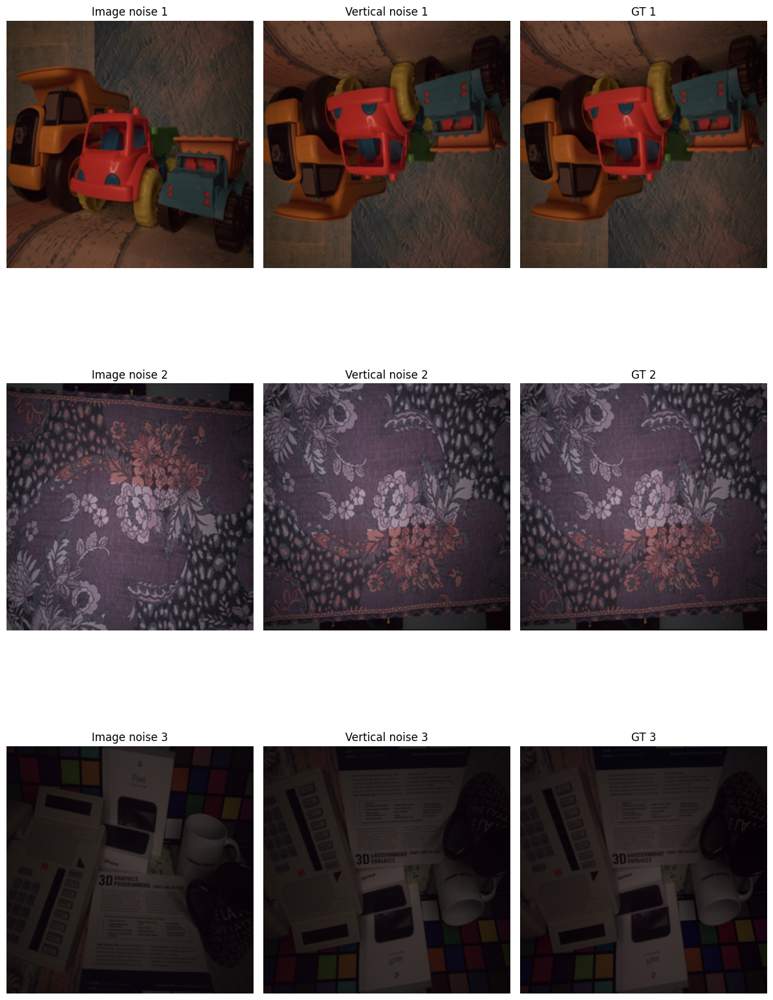

In [27]:
num_images_to_display = 3

plt.figure(figsize=(12, 6*num_images_to_display))  # Adjust the figure size as needed

for i in range(num_images_to_display):
    plt.subplot(num_images_to_display, 3, 3*i+1)
    plt.imshow(noisy_train[i+1])
    plt.title('Image noise {}'.format(i+1))
    plt.axis('off')

    plt.subplot(num_images_to_display, 3, 3*i+2)
    plt.imshow(noisy_train_vertical[i+1])
    plt.title('Vertical noise {}'.format(i+1))
    plt.axis('off')

    plt.subplot(num_images_to_display, 3, 3*i+3)
    plt.imshow(gt_train_vertical[i+1])
    plt.title('GT {}'.format(i+1))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [28]:
noisy_train = np.vstack((noisy_train, noisy_train_vertical, noisy_train_horizontal)).transpose(0, 3, 1, 2)
gt_train = np.vstack((gt_train, gt_train_vertical, gt_train_horizontal)).transpose(0, 3, 1, 2)

print(noisy_train.shape)
print(gt_train.shape)

print(noisy_train.dtype)
print(gt_train.dtype)

(384, 3, 256, 256)
(384, 3, 256, 256)
float32
float32


In [29]:
train_dataloader = DataLoader(ImageDataset(noisy_train, gt_train), batch_size=8, shuffle=True, num_workers=2)
val_dataloader = DataLoader(ImageDataset(noisy_val, gt_val), batch_size=8, shuffle=True, num_workers=2)
test_dataloader = DataLoader(ImageDataset(noisy_test, gt_test), batch_size=8, shuffle=True, num_workers=2)

In [30]:
from torchmetrics.image import StructuralSimilarityIndexMeasure

# device = xm.xla_device()
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

def psnr(img1, img2, data_range=1.0):
    """
    Compute Peak Signal-to-Noise Ratio (PSNR) between two images.

    Args:
        img1 (torch.Tensor): Input image tensor, shape (batch_size, channels, height, width).
        img2 (torch.Tensor): Input image tensor, shape (batch_size, channels, height, width).
        data_range (float): Range of valid pixel values in the image. Default is 1.0.

    Returns:
        torch.Tensor: PSNR value, shape (batch_size,)
    """
    mse = F.mse_loss(img1, img2)
    psnr_val = 20 * torch.log10(data_range / torch.sqrt(mse))
    return psnr_val

def loss_func(x,y):
    return 100-psnr(x,y)

# loss_func = nn.MSELoss()

In [31]:
def evaluate_model(model, dataloader, devic=device):
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute metrics
            loss_val = loss_func(outputs, targets)
            psnr_val = psnr(outputs, targets)
            ssim_val = ssim(outputs, targets)

            total_loss += loss_val.item()
            total_psnr += psnr_val.item()
            total_ssim += ssim_val.item()

    avg_loss = total_loss/ len(dataloader)
    avg_psnr = total_psnr / len(dataloader)
    avg_ssim = total_ssim / len(dataloader)

    return avg_loss, avg_psnr, avg_ssim

In [33]:
# model.to(device)

train_loss = []
train_psnr = []
train_ssim = []
val_loss = []
val_psnr = []
val_ssim = []

# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Training loop
num_epochs = 60
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()

    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    loop = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    for batch_idx, (inputs, targets) in loop:
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        outputs = model(inputs)

        # Compute loss
        loss = loss_func(outputs, targets)
        psnr_val = psnr(outputs, targets)
        ssim_val = ssim(outputs,targets)

        total_loss += loss.item()
        total_psnr += psnr_val.item()
        total_ssim += ssim_val.item()

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Print training progress
        loop.set_description(f'Step [{batch_idx+1}/{len(train_dataloader)}]')
        loop.set_postfix(loss=loss.item(), psnr=psnr_val.item(), ssim=ssim_val.item())

#     scheduler.step()

    avg_loss = total_loss / len(train_dataloader)
    avg_psnr = total_psnr / len(train_dataloader)
    avg_ssim = total_ssim / len(train_dataloader)

    print(f"\nAvg Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

    # Evaluate the model on the test set
    avg_loss_val, avg_psnr_val, avg_ssim_val = evaluate_model(model, val_dataloader, device)
    print(f"Val Loss: {avg_loss_val}, Val PSNR: {avg_psnr_val:.4f}, Val SSIM: {avg_ssim_val:.4f}")

    train_loss.append(avg_loss)
    train_psnr.append(avg_psnr)
    train_ssim.append(avg_ssim)
    val_loss.append(avg_loss_val)
    val_psnr.append(avg_psnr_val)
    val_ssim.append(avg_ssim_val)


# Save trained model
torch.save(model.state_dict(), 'swinir_model.pth')

Epoch 1/60


  0%|          | 0/48 [00:00<?, ?it/s]/tmp/ipykernel_34/2100443901.py:19: DeprecationWarning: 'saved_variables' is deprecated; use 'saved_tensors'
  y, var, weight = ctx.saved_variables
Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.41it/s, loss=67, psnr=33, ssim=0.948]    


Avg Loss: 67.5069, Avg PSNR: 32.4931, Avg SSIM: 0.9103


Val Loss: 63.32968711853027, Val PSNR: 36.6703, Val SSIM: 0.9392
Epoch 2/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=62.5, psnr=37.5, ssim=0.971]


Avg Loss: 63.6182, Avg PSNR: 36.3818, Avg SSIM: 0.9585


Val Loss: 63.21232604980469, Val PSNR: 36.7877, Val SSIM: 0.9507
Epoch 3/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=62.2, psnr=37.8, ssim=0.967]


Avg Loss: 63.7687, Avg PSNR: 36.2313, Avg SSIM: 0.9599


Val Loss: 61.78808784484863, Val PSNR: 38.2119, Val SSIM: 0.9589
Epoch 4/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=62.4, psnr=37.6, ssim=0.971]


Avg Loss: 62.3078, Avg PSNR: 37.6922, Avg SSIM: 0.9678


Val Loss: 61.46233940124512, Val PSNR: 38.5377, Val SSIM: 0.9658
Epoch 5/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=62.8, psnr=37.2, ssim=0.977]


Avg Loss: 61.7882, Avg PSNR: 38.2118, Avg SSIM: 0.9734


Val Loss: 61.873117446899414, Val PSNR: 38.1269, Val SSIM: 0.9695
Epoch 6/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=59.7, psnr=40.3, ssim=0.984]


Avg Loss: 61.6558, Avg PSNR: 38.3442, Avg SSIM: 0.9756


Val Loss: 60.905189514160156, Val PSNR: 39.0948, Val SSIM: 0.9729
Epoch 7/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=62.7, psnr=37.3, ssim=0.973]


Avg Loss: 62.5272, Avg PSNR: 37.4728, Avg SSIM: 0.9744


Val Loss: 61.565467834472656, Val PSNR: 38.4345, Val SSIM: 0.9702
Epoch 8/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=57.6, psnr=42.4, ssim=0.984]


Avg Loss: 61.0299, Avg PSNR: 38.9701, Avg SSIM: 0.9771


Val Loss: 60.94334030151367, Val PSNR: 39.0567, Val SSIM: 0.9758
Epoch 9/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=56.6, psnr=43.4, ssim=0.991]


Avg Loss: 60.8619, Avg PSNR: 39.1381, Avg SSIM: 0.9780


Val Loss: 61.0594596862793, Val PSNR: 38.9405, Val SSIM: 0.9765
Epoch 10/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=63.7, psnr=36.3, ssim=0.977]


Avg Loss: 61.0411, Avg PSNR: 38.9589, Avg SSIM: 0.9795


Val Loss: 63.1501579284668, Val PSNR: 36.8498, Val SSIM: 0.9742
Epoch 11/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=61.9, psnr=38.1, ssim=0.975]


Avg Loss: 60.4925, Avg PSNR: 39.5075, Avg SSIM: 0.9801


Val Loss: 60.033390045166016, Val PSNR: 39.9666, Val SSIM: 0.9771
Epoch 12/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=58.5, psnr=41.5, ssim=0.988]


Avg Loss: 60.3949, Avg PSNR: 39.6051, Avg SSIM: 0.9812


Val Loss: 60.93906211853027, Val PSNR: 39.0609, Val SSIM: 0.9782
Epoch 13/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=62.8, psnr=37.2, ssim=0.979]


Avg Loss: 60.4701, Avg PSNR: 39.5299, Avg SSIM: 0.9811


Val Loss: 60.45684814453125, Val PSNR: 39.5432, Val SSIM: 0.9797
Epoch 14/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=69.2, psnr=30.8, ssim=0.809]


Avg Loss: 63.2314, Avg PSNR: 36.7686, Avg SSIM: 0.9073


Val Loss: 66.44258880615234, Val PSNR: 33.5574, Val SSIM: 0.8341
Epoch 15/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=61.6, psnr=38.4, ssim=0.982]


Avg Loss: 63.1699, Avg PSNR: 36.8301, Avg SSIM: 0.9227


Val Loss: 59.5257682800293, Val PSNR: 40.4742, Val SSIM: 0.9750
Epoch 16/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=57.5, psnr=42.5, ssim=0.989]


Avg Loss: 60.1164, Avg PSNR: 39.8836, Avg SSIM: 0.9803


Val Loss: 59.41561508178711, Val PSNR: 40.5844, Val SSIM: 0.9796
Epoch 17/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=61, psnr=39, ssim=0.98]     


Avg Loss: 60.2358, Avg PSNR: 39.7642, Avg SSIM: 0.9813


Val Loss: 59.891672134399414, Val PSNR: 40.1083, Val SSIM: 0.9788
Epoch 18/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=61.4, psnr=38.6, ssim=0.978]


Avg Loss: 59.8608, Avg PSNR: 40.1392, Avg SSIM: 0.9820


Val Loss: 59.171142578125, Val PSNR: 40.8289, Val SSIM: 0.9792
Epoch 19/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=59.6, psnr=40.4, ssim=0.987]


Avg Loss: 59.6000, Avg PSNR: 40.4000, Avg SSIM: 0.9820


Val Loss: 58.04724884033203, Val PSNR: 41.9528, Val SSIM: 0.9801
Epoch 20/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=62.6, psnr=37.4, ssim=0.966]


Avg Loss: 58.8982, Avg PSNR: 41.1018, Avg SSIM: 0.9826


Val Loss: 59.006967544555664, Val PSNR: 40.9930, Val SSIM: 0.9801
Epoch 21/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=56.8, psnr=43.2, ssim=0.988]


Avg Loss: 59.1270, Avg PSNR: 40.8730, Avg SSIM: 0.9826


Val Loss: 57.837345123291016, Val PSNR: 42.1627, Val SSIM: 0.9804
Epoch 22/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=61.2, psnr=38.8, ssim=0.971]


Avg Loss: 58.8786, Avg PSNR: 41.1214, Avg SSIM: 0.9829


Val Loss: 57.955976486206055, Val PSNR: 42.0440, Val SSIM: 0.9809
Epoch 23/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=60.9, psnr=39.1, ssim=0.981]


Avg Loss: 58.5512, Avg PSNR: 41.4488, Avg SSIM: 0.9834


Val Loss: 57.21643257141113, Val PSNR: 42.7836, Val SSIM: 0.9815
Epoch 24/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=57, psnr=43, ssim=0.985]    


Avg Loss: 58.0627, Avg PSNR: 41.9373, Avg SSIM: 0.9840


Val Loss: 57.32926368713379, Val PSNR: 42.6707, Val SSIM: 0.9823
Epoch 25/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=58.4, psnr=41.6, ssim=0.983]


Avg Loss: 58.0997, Avg PSNR: 41.9003, Avg SSIM: 0.9842


Val Loss: 57.6035041809082, Val PSNR: 42.3965, Val SSIM: 0.9818
Epoch 26/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=58.2, psnr=41.8, ssim=0.983]


Avg Loss: 57.8499, Avg PSNR: 42.1501, Avg SSIM: 0.9842


Val Loss: 58.128299713134766, Val PSNR: 41.8717, Val SSIM: 0.9825
Epoch 27/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=61, psnr=39, ssim=0.982]    


Avg Loss: 57.8488, Avg PSNR: 42.1512, Avg SSIM: 0.9846


Val Loss: 57.228036880493164, Val PSNR: 42.7720, Val SSIM: 0.9831
Epoch 28/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=60.3, psnr=39.7, ssim=0.989]


Avg Loss: 57.5823, Avg PSNR: 42.4177, Avg SSIM: 0.9852


Val Loss: 56.99771499633789, Val PSNR: 43.0023, Val SSIM: 0.9820
Epoch 29/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=56.9, psnr=43.1, ssim=0.984]


Avg Loss: 57.2738, Avg PSNR: 42.7262, Avg SSIM: 0.9854


Val Loss: 56.92130088806152, Val PSNR: 43.0787, Val SSIM: 0.9836
Epoch 30/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=58.3, psnr=41.7, ssim=0.982]


Avg Loss: 57.0947, Avg PSNR: 42.9053, Avg SSIM: 0.9860


Val Loss: 56.758880615234375, Val PSNR: 43.2411, Val SSIM: 0.9842
Epoch 31/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=59.2, psnr=40.8, ssim=0.983]


Avg Loss: 56.7894, Avg PSNR: 43.2106, Avg SSIM: 0.9862


Val Loss: 56.52785682678223, Val PSNR: 43.4721, Val SSIM: 0.9841
Epoch 32/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=60.7, psnr=39.3, ssim=0.974]


Avg Loss: 57.6692, Avg PSNR: 42.3308, Avg SSIM: 0.9842


Val Loss: 58.14604187011719, Val PSNR: 41.8540, Val SSIM: 0.9766
Epoch 33/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.66it/s, loss=58, psnr=42, ssim=0.985]    


Avg Loss: 58.1372, Avg PSNR: 41.8628, Avg SSIM: 0.9809


Val Loss: 57.670305252075195, Val PSNR: 42.3297, Val SSIM: 0.9809
Epoch 34/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=55.4, psnr=44.6, ssim=0.989]


Avg Loss: 57.2024, Avg PSNR: 42.7976, Avg SSIM: 0.9852


Val Loss: 56.712825775146484, Val PSNR: 43.2872, Val SSIM: 0.9838
Epoch 35/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=60.3, psnr=39.7, ssim=0.988]


Avg Loss: 57.0785, Avg PSNR: 42.9215, Avg SSIM: 0.9860


Val Loss: 57.158355712890625, Val PSNR: 42.8416, Val SSIM: 0.9840
Epoch 36/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=56.7, psnr=43.3, ssim=0.987]


Avg Loss: 56.7656, Avg PSNR: 43.2344, Avg SSIM: 0.9864


Val Loss: 56.61483955383301, Val PSNR: 43.3852, Val SSIM: 0.9841
Epoch 37/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=54.1, psnr=45.9, ssim=0.993]


Avg Loss: 56.9569, Avg PSNR: 43.0431, Avg SSIM: 0.9864


Val Loss: 56.1628475189209, Val PSNR: 43.8372, Val SSIM: 0.9849
Epoch 38/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=54.6, psnr=45.4, ssim=0.991]


Avg Loss: 57.1055, Avg PSNR: 42.8945, Avg SSIM: 0.9862


Val Loss: 56.385446548461914, Val PSNR: 43.6146, Val SSIM: 0.9843
Epoch 39/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=56, psnr=44, ssim=0.987]    


Avg Loss: 56.6059, Avg PSNR: 43.3941, Avg SSIM: 0.9867


Val Loss: 56.178462982177734, Val PSNR: 43.8215, Val SSIM: 0.9856
Epoch 40/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=55.1, psnr=44.9, ssim=0.991]


Avg Loss: 56.5451, Avg PSNR: 43.4549, Avg SSIM: 0.9869


Val Loss: 56.3136100769043, Val PSNR: 43.6864, Val SSIM: 0.9854
Epoch 41/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=56.2, psnr=43.8, ssim=0.99] 


Avg Loss: 56.4650, Avg PSNR: 43.5350, Avg SSIM: 0.9870


Val Loss: 56.1282844543457, Val PSNR: 43.8717, Val SSIM: 0.9857
Epoch 42/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=54.8, psnr=45.2, ssim=0.99] 


Avg Loss: 56.5308, Avg PSNR: 43.4692, Avg SSIM: 0.9872


Val Loss: 56.875186920166016, Val PSNR: 43.1248, Val SSIM: 0.9852
Epoch 43/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=54.4, psnr=45.6, ssim=0.99] 


Avg Loss: 56.3808, Avg PSNR: 43.6192, Avg SSIM: 0.9872


Val Loss: 56.04106903076172, Val PSNR: 43.9589, Val SSIM: 0.9857
Epoch 44/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=56.9, psnr=43.1, ssim=0.984]


Avg Loss: 56.3365, Avg PSNR: 43.6635, Avg SSIM: 0.9873


Val Loss: 56.0380802154541, Val PSNR: 43.9619, Val SSIM: 0.9858
Epoch 45/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=57.2, psnr=42.8, ssim=0.983]


Avg Loss: 56.5896, Avg PSNR: 43.4104, Avg SSIM: 0.9870


Val Loss: 56.38313102722168, Val PSNR: 43.6169, Val SSIM: 0.9847
Epoch 46/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=56, psnr=44, ssim=0.988]    


Avg Loss: 57.2364, Avg PSNR: 42.7636, Avg SSIM: 0.9848


Val Loss: 56.56985664367676, Val PSNR: 43.4301, Val SSIM: 0.9830
Epoch 47/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=57.9, psnr=42.1, ssim=0.982]


Avg Loss: 56.6251, Avg PSNR: 43.3749, Avg SSIM: 0.9863


Val Loss: 55.93880653381348, Val PSNR: 44.0612, Val SSIM: 0.9853
Epoch 48/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=57.4, psnr=42.6, ssim=0.987]


Avg Loss: 56.1787, Avg PSNR: 43.8213, Avg SSIM: 0.9873


Val Loss: 56.09758949279785, Val PSNR: 43.9024, Val SSIM: 0.9857
Epoch 49/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.68it/s, loss=58, psnr=42, ssim=0.981]    


Avg Loss: 55.9346, Avg PSNR: 44.0654, Avg SSIM: 0.9878


Val Loss: 56.401655197143555, Val PSNR: 43.5983, Val SSIM: 0.9861
Epoch 50/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=53.5, psnr=46.5, ssim=0.991]


Avg Loss: 56.2113, Avg PSNR: 43.7887, Avg SSIM: 0.9877


Val Loss: 56.52876281738281, Val PSNR: 43.4712, Val SSIM: 0.9863
Epoch 51/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.67it/s, loss=56, psnr=44, ssim=0.989]    


Avg Loss: 55.9946, Avg PSNR: 44.0054, Avg SSIM: 0.9881


Val Loss: 55.54029083251953, Val PSNR: 44.4597, Val SSIM: 0.9864
Epoch 52/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=54.4, psnr=45.6, ssim=0.992]


Avg Loss: 55.8870, Avg PSNR: 44.1130, Avg SSIM: 0.9882


Val Loss: 55.96503829956055, Val PSNR: 44.0350, Val SSIM: 0.9865
Epoch 53/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=56.3, psnr=43.7, ssim=0.986]


Avg Loss: 55.8133, Avg PSNR: 44.1867, Avg SSIM: 0.9883


Val Loss: 56.06612777709961, Val PSNR: 43.9339, Val SSIM: 0.9866
Epoch 54/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=54.5, psnr=45.5, ssim=0.99] 


Avg Loss: 55.9179, Avg PSNR: 44.0821, Avg SSIM: 0.9882


Val Loss: 55.88191604614258, Val PSNR: 44.1181, Val SSIM: 0.9862
Epoch 55/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=55.5, psnr=44.5, ssim=0.989]


Avg Loss: 56.1069, Avg PSNR: 43.8931, Avg SSIM: 0.9882


Val Loss: 55.478782653808594, Val PSNR: 44.5212, Val SSIM: 0.9869
Epoch 56/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=53.3, psnr=46.7, ssim=0.995]


Avg Loss: 55.7458, Avg PSNR: 44.2542, Avg SSIM: 0.9885


Val Loss: 56.199005126953125, Val PSNR: 43.8010, Val SSIM: 0.9864
Epoch 57/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=54.7, psnr=45.3, ssim=0.992]


Avg Loss: 55.6065, Avg PSNR: 44.3935, Avg SSIM: 0.9885


Val Loss: 55.37160301208496, Val PSNR: 44.6284, Val SSIM: 0.9871
Epoch 58/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=57.4, psnr=42.6, ssim=0.986]


Avg Loss: 55.5660, Avg PSNR: 44.4340, Avg SSIM: 0.9888


Val Loss: 55.548269271850586, Val PSNR: 44.4517, Val SSIM: 0.9870
Epoch 59/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.69it/s, loss=56.1, psnr=43.9, ssim=0.988]


Avg Loss: 55.5060, Avg PSNR: 44.4940, Avg SSIM: 0.9889


Val Loss: 55.45907211303711, Val PSNR: 44.5409, Val SSIM: 0.9873
Epoch 60/60


Step [48/48]: 100%|██████████| 48/48 [00:10<00:00,  4.70it/s, loss=55.4, psnr=44.6, ssim=0.989]


Avg Loss: 55.5317, Avg PSNR: 44.4683, Avg SSIM: 0.9890


Val Loss: 55.99115562438965, Val PSNR: 44.0088, Val SSIM: 0.9869


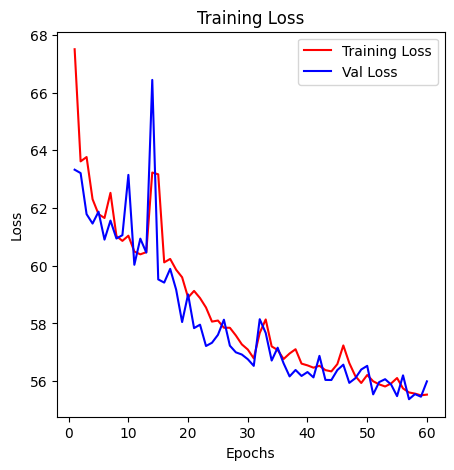

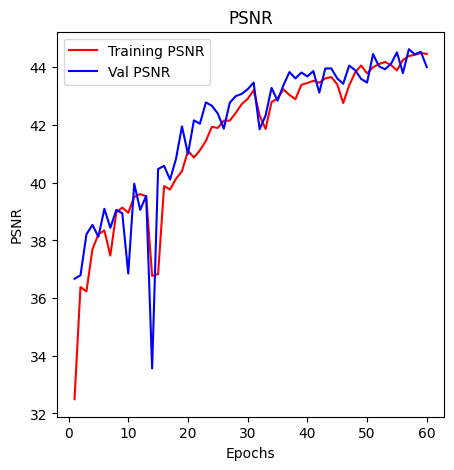

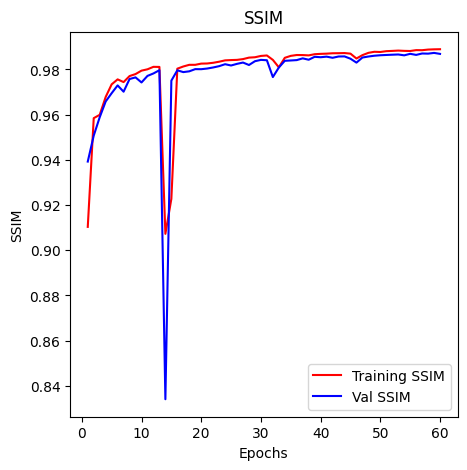

In [34]:
epochs = range(1, len(train_loss) + 1)

# Plotting train loss
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Val Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting train PSNR
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_psnr, 'r', label='Training PSNR')
plt.plot(epochs, val_psnr, 'b', label='Val PSNR')
plt.title('PSNR')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.show()

# Plotting train SSIM
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_ssim, 'r', label='Training SSIM')
plt.plot(epochs, val_ssim, 'b', label='Val SSIM')
plt.title('SSIM')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.show()

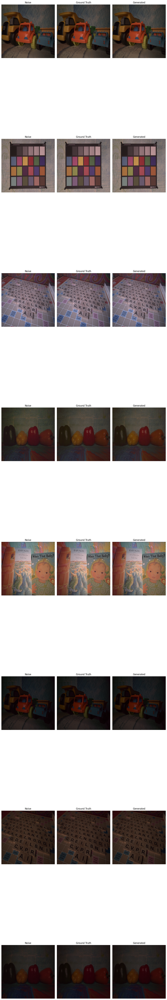

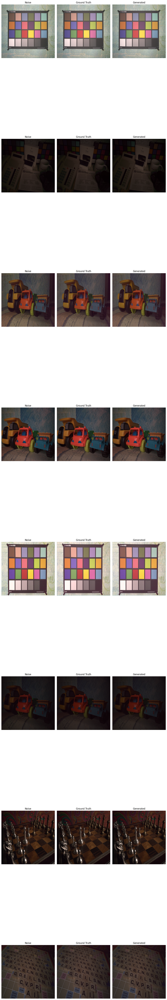

In [35]:
##### Set model to evaluation mode
from torch.autograd import Variable
model.eval()
cuda = torch.cuda.is_available()
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor
# Iterate over a few batches from the test dataset

for batch_idx, (lr,hr) in enumerate(test_dataloader):
    # Get inputs
    imgs_lr = Variable(lr.type(Tensor))
    imgs_hr = Variable(hr.type(Tensor))

    # Forward pass: Generate high-resolution images
    with torch.no_grad():
        gen_hr = model(imgs_lr)

    # Visualize a few sample images
    num_samples = min(100, len(imgs_lr))

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 10))
    for i in range(num_samples):
        # Original LR image
        axes[i, 0].imshow(imgs_lr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 0].set_title("Noise")
        axes[i, 0].axis("off")

        # Ground truth HR image
        axes[i, 1].imshow(imgs_hr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Generated HR image
        axes[i, 2].imshow(gen_hr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 2].set_title("Generated")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Only visualize a few batches
    if batch_idx == 1:
        break

In [49]:
# Half-U-Net
loss, psnr, ssim = evaluate_model(model, test_dataloader)
print(f'Loss: {loss}')
print(f'PSNR: {psnr}')
print(f'SSIM: {ssim}')

Loss: 58.79207992553711
PSNR: 41.20792007446289
SSIM: 0.9802002012729645


In [36]:
# NAFNet_v1
loss, psnr, ssim = evaluate_model(model, test_dataloader)
print(f'Loss: {loss}')
print(f'PSNR: {psnr}')
print(f'SSIM: {ssim}')

Loss: 55.74131965637207
PSNR: 44.25868034362793
SSIM: 0.9867691099643707
